**Week-3:Initial Model Training**

loading annotations into memory...
Done (t=0.95s)
creating index...
index created!
Epoch [1/2], Loss: 0.5797
Epoch [2/2], Loss: 0.4404


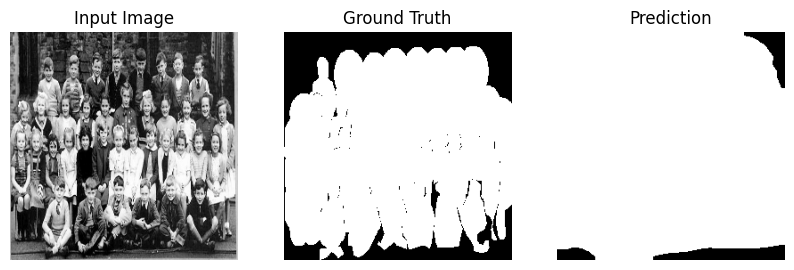

In [ ]:
# =========================================
# Week 3: Initial Model Training
# Goal: Train a pretrained DeepLabV3 model on processed binary masks
# =========================================

# =========================
# Step 0: Imports
# =========================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.segmentation import DeepLabV3_ResNet50_Weights
import cv2
import numpy as np
import os
import random
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils

# =========================
# Step 1: Dataset Definition
# =========================
class SegmentationDataset(Dataset):
    def __init__(self, img_ids, img_folder, coco, img_size=(256,256)):
        self.img_ids = img_ids
        self.img_folder = img_folder
        self.coco = coco
        self.img_size = img_size

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_folder, img_info['file_name'])

        # Read and preprocess image
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, self.img_size)
        image = image / 255.0  # normalize
        image = np.transpose(image, (2,0,1)).astype(np.float32)  # C,H,W

        # Create combined mask (binary)
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        for ann in anns:
            if 'segmentation' in ann:
                rle = mask_utils.frPyObjects(ann['segmentation'], img_info['height'], img_info['width'])
                decoded = mask_utils.decode(rle)
                if decoded.ndim == 3:
                    decoded = np.sum(decoded, axis=2)
                mask += decoded
        mask = np.clip(mask, 0, 1)
        mask = cv2.resize(mask, self.img_size, interpolation=cv2.INTER_NEAREST)
        mask = np.expand_dims(mask, axis=0).astype(np.float32)  # 1,H,W

        return torch.tensor(image), torch.tensor(mask)

# =========================
# Step 2: Load dataset
# =========================
VAL_FOLDER = "/content/drive/MyDrive/VisionExtract/val2017"
ANNOT_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"

coco = COCO(ANNOT_FILE)

# Use 50 random images for demo training
img_ids = random.sample(coco.getImgIds(), 50)
dataset = SegmentationDataset(img_ids, VAL_FOLDER, coco)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

# =========================
# Step 3: Model
# =========================
weights = DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
model = torchvision.models.segmentation.deeplabv3_resnet50(weights=weights)

# Modify classifier for binary mask
model.classifier[-1] = nn.Conv2d(256, 1, kernel_size=(1,1))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# =========================
# Step 4: Loss and Optimizer
# =========================
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# =========================
# Step 5: Training Loop (demo: 2 epochs)
# =========================
for epoch in range(2):
    model.train()
    running_loss = 0.0
    for images, masks in dataloader:
        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(dataset)
    print(f"Epoch [{epoch+1}/2], Loss: {epoch_loss:.4f}")

# =========================
# Step 6: Visualize Predictions
# =========================
model.eval()
with torch.no_grad():
    sample_img, sample_mask = dataset[0]
    input_img = sample_img.unsqueeze(0).to(device)
    pred = model(input_img)['out']
    pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()
    pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

    plt.figure(figsize=(10,5))
    plt.subplot(1,3,1)
    plt.imshow(np.transpose(sample_img, (1,2,0)))
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(sample_mask.squeeze(), cmap='gray')
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_mask_bin, cmap='gray')
    plt.title("Prediction")
    plt.axis("off")
    plt.show()


In [ ]:
torch.save(model, "deeplabv3_binary_model.pth")


In [ ]:
import torch

# Save full model
full_model_path = "/content/drive/MyDrive/VisionExtract/deeplabv3_binary_model.pth"
torch.save(model, full_model_path)
print(f"Full model saved at: {full_model_path}")

# Save only model weights
weights_path = "/content/drive/MyDrive/VisionExtract/deeplabv3_binary_weights.pth"
torch.save(model.state_dict(), weights_path)
print(f"Model weights saved at: {weights_path}")


Full model saved at: /content/drive/MyDrive/VisionExtract/deeplabv3_binary_model.pth
Model weights saved at: /content/drive/MyDrive/VisionExtract/deeplabv3_binary_weights.pth


loading annotations into memory...
Done (t=0.91s)
creating index...
index created!
Model loaded successfully!


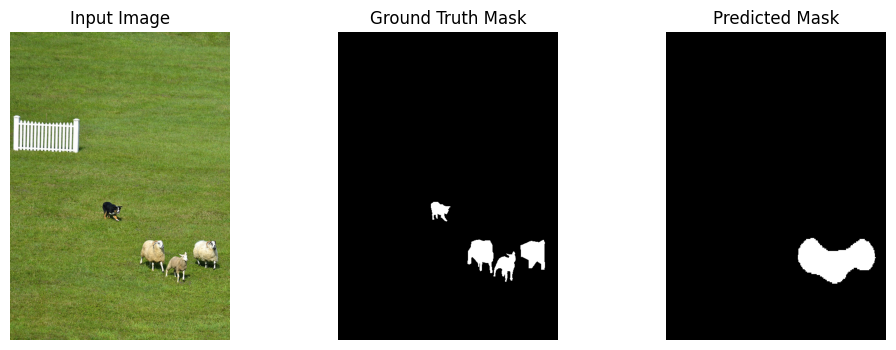

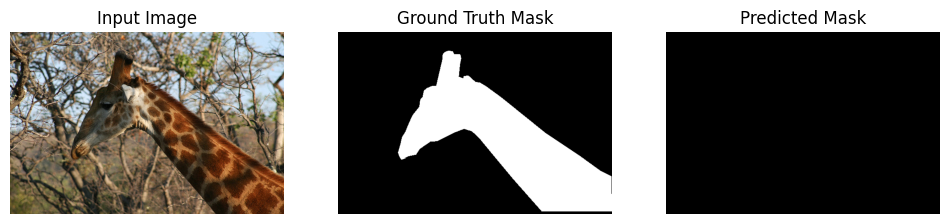

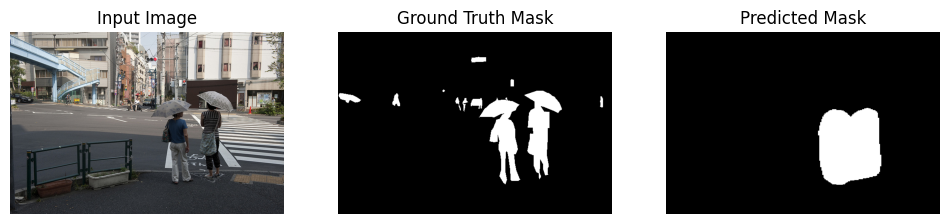

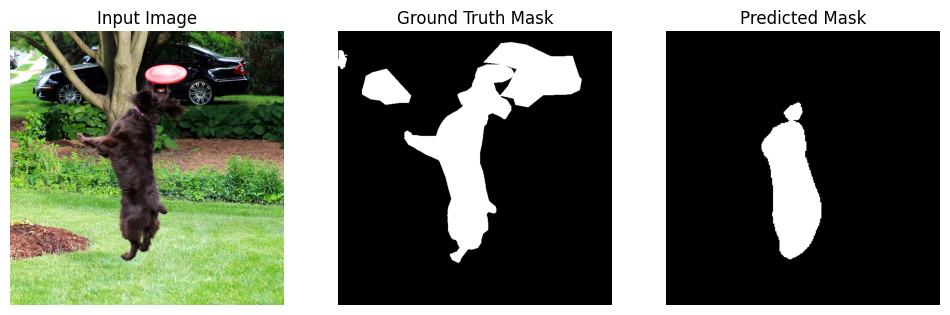

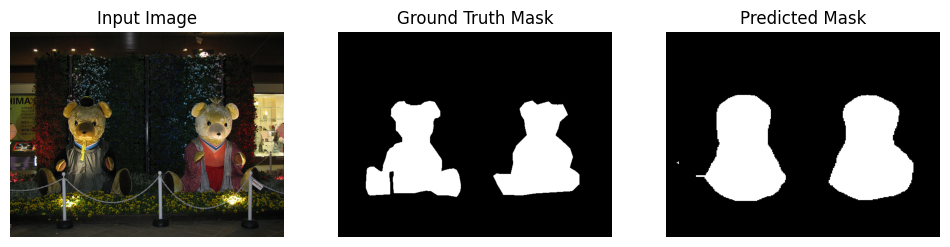

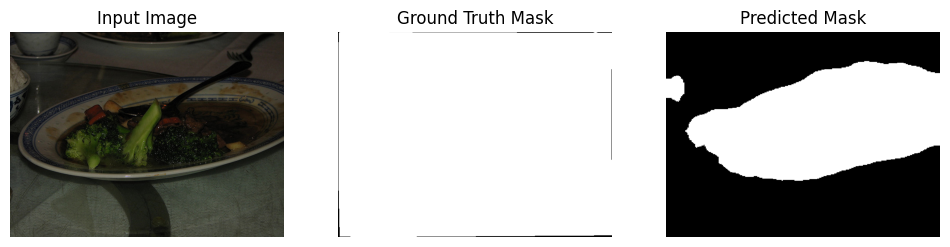

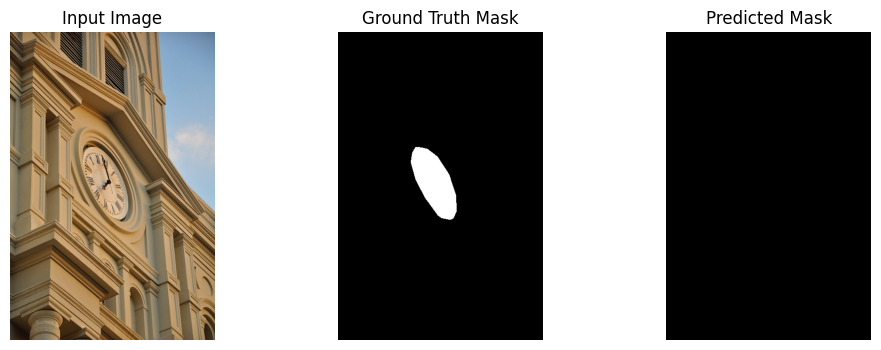

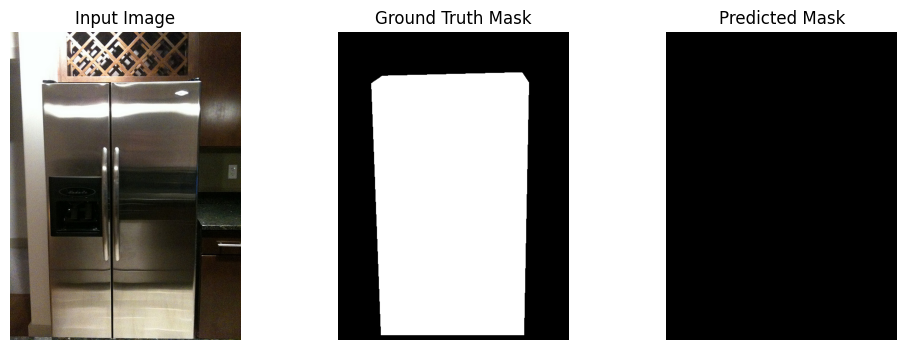

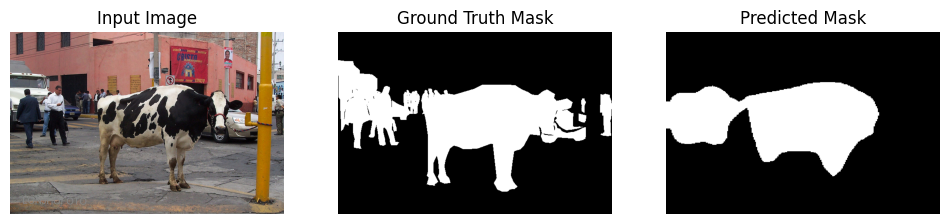

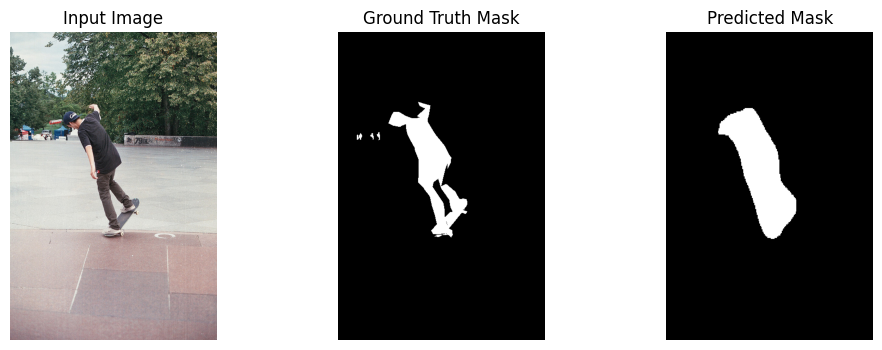

In [ ]:
# =========================
# Step 0: Imports
# =========================
import torch
import torchvision
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from pycocotools.coco import COCO

# =========================
# Step 1: Paths & Device
# =========================
VAL_FOLDER = "/content/drive/MyDrive/VisionExtract/val2017"
ANNOT_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"
WEIGHTS_PATH = "/content/drive/MyDrive/VisionExtract/deeplabv3_binary_weights.pth"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# =========================
# Step 2: Load COCO
# =========================
coco = COCO(ANNOT_FILE)
img_ids = random.sample(coco.getImgIds(), 10)  # pick 10 random images

# =========================
# Step 3: Load Model
# =========================
# Initialize model
model = torchvision.models.segmentation.deeplabv3_resnet50(weights=None)
model.classifier[-1] = torch.nn.Conv2d(256, 1, kernel_size=(1,1))
model.aux_classifier = None  # remove auxiliary classifier
model = model.to(device)

# Load weights ignoring aux_classifier keys if present
state_dict = torch.load(WEIGHTS_PATH, map_location=device)
state_dict = {k: v for k, v in state_dict.items() if "aux_classifier" not in k}
model.load_state_dict(state_dict, strict=False)
model.eval()
print("Model loaded successfully!")

# =========================
# Step 4: Function to create binary mask
# =========================
def create_combined_mask(img_id):
    img_info = coco.loadImgs(img_id)[0]
    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    for ann in anns:
        if 'segmentation' in ann:
            rle = mask_utils.frPyObjects(ann['segmentation'], img_info['height'], img_info['width'])
            decoded = mask_utils.decode(rle)
            if decoded.ndim == 3:
                decoded = np.sum(decoded, axis=2)
            mask += decoded
    mask = np.clip(mask, 0, 1)
    return mask

# =========================
# Step 5: Visualize Predictions
# =========================
for img_id in img_ids:
    img_info = coco.loadImgs(img_id)[0]
    img_path = f"{VAL_FOLDER}/{img_info['file_name']}"
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    orig_h, orig_w = image.shape[:2]

    # Preprocess image
    img_resized = cv2.resize(image, (256,256)) / 255.0
    input_tensor = torch.tensor(np.transpose(img_resized, (2,0,1)), dtype=torch.float32).unsqueeze(0).to(device)

    # Predict mask
    with torch.no_grad():
        pred = model(input_tensor)['out']
        pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()
        pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)
        pred_mask_bin = cv2.resize(pred_mask_bin, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)

    # Ground truth mask
    gt_mask = create_combined_mask(img_id)

    # Plot
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(gt_mask, cmap='gray')
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_mask_bin, cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()


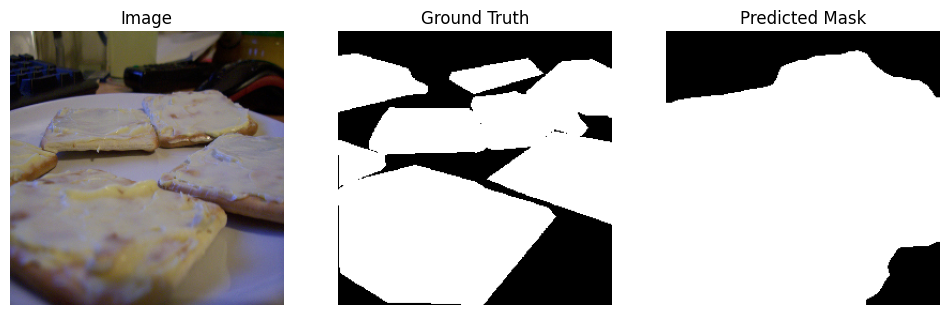

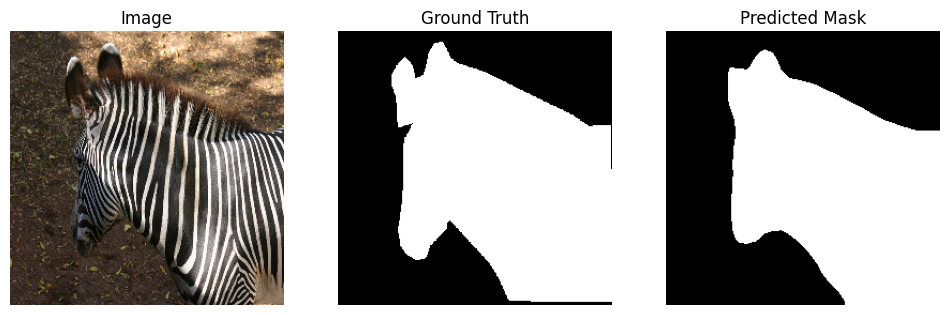

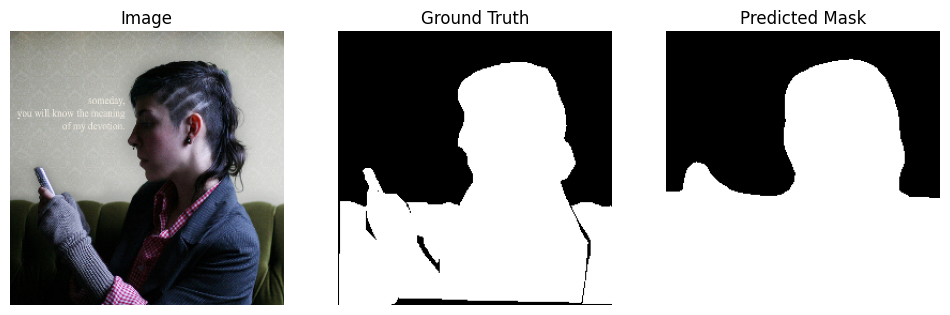

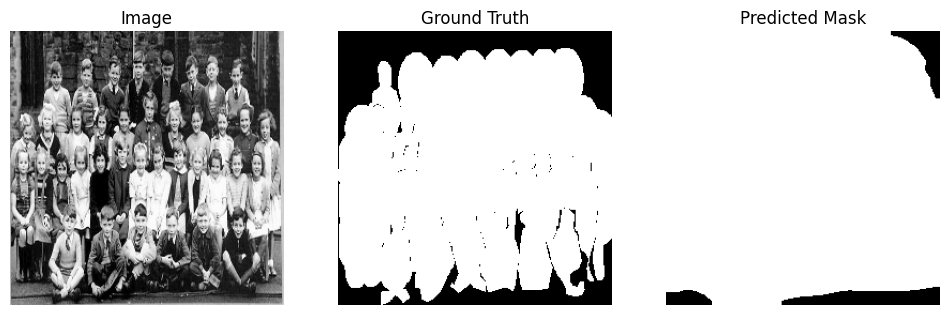

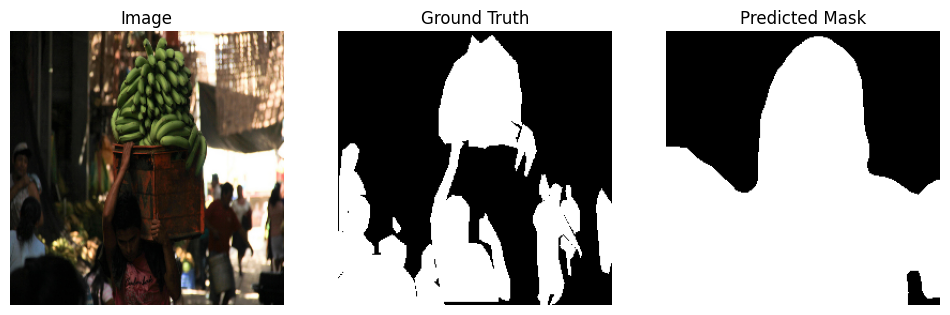

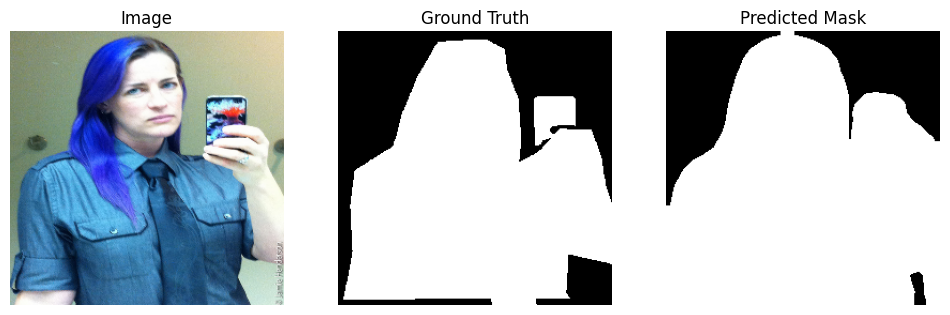

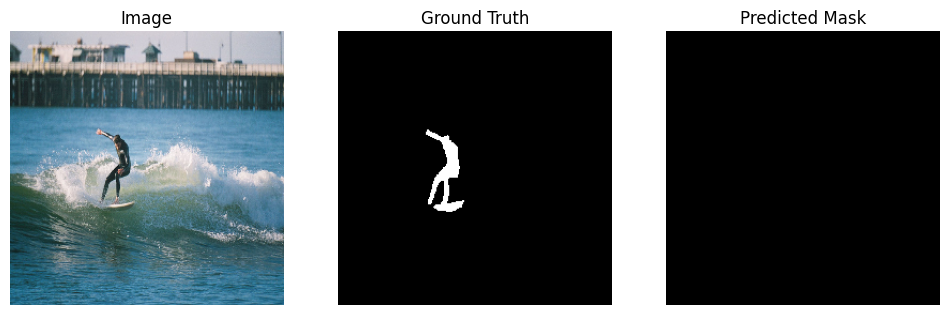

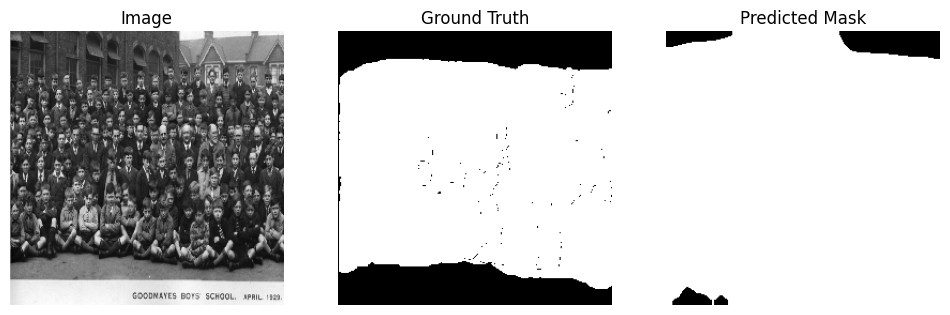

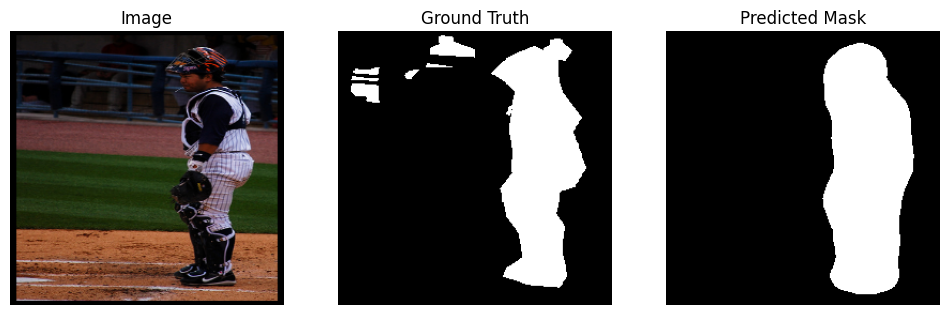

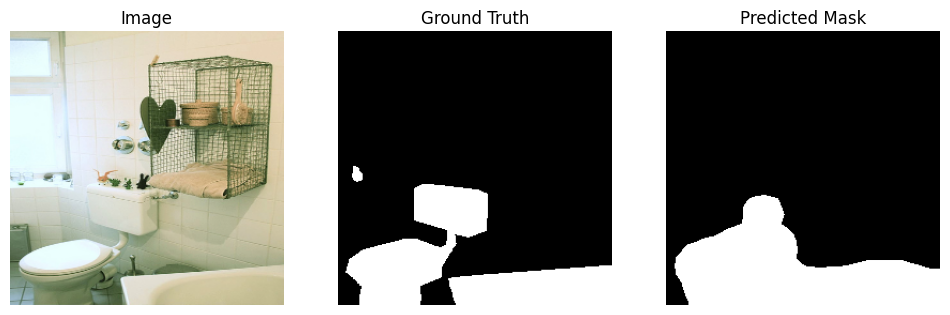

In [ ]:
import random
import matplotlib.pyplot as plt
import torch
import numpy as np

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

# Ensure the number of images to visualize does not exceed dataset size
num_to_visualize = min(15, len(img_ids))
sample_img_ids = random.sample(img_ids, num_to_visualize)

with torch.no_grad():
    for idx, img_id in enumerate(sample_img_ids):
        # Get image and ground truth mask
        img_tensor, mask_tensor = dataset[img_ids.index(img_id)]
        input_img = img_tensor.unsqueeze(0).to(device)

        # Model prediction
        pred = model(input_img)['out']
        pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()
        pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

        # Plot
        plt.figure(figsize=(12,5))

        plt.subplot(1,3,1)
        plt.imshow(np.transpose(img_tensor, (1,2,0)))
        plt.title("Image")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(mask_tensor.squeeze(), cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_mask_bin, cmap='gray')
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.show()


**Week 4: Predictions and Fine-tuning**

loading annotations into memory...
Done (t=0.38s)
creating index...
index created!
Epoch [1/2], Train Loss: 0.5739, Val Loss: 0.4156
Epoch [2/2], Train Loss: 0.4482, Val Loss: 0.3931


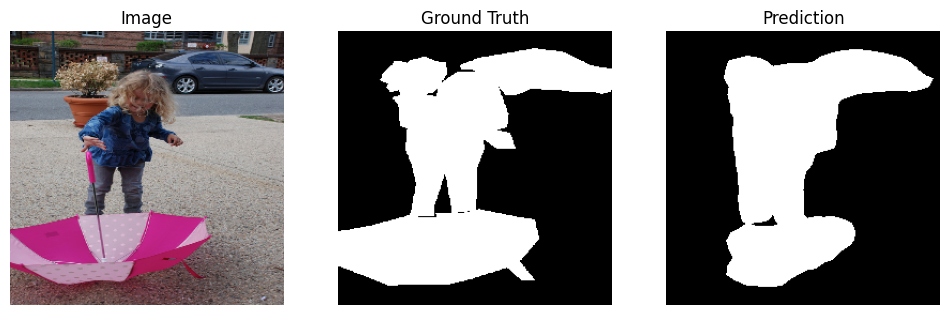

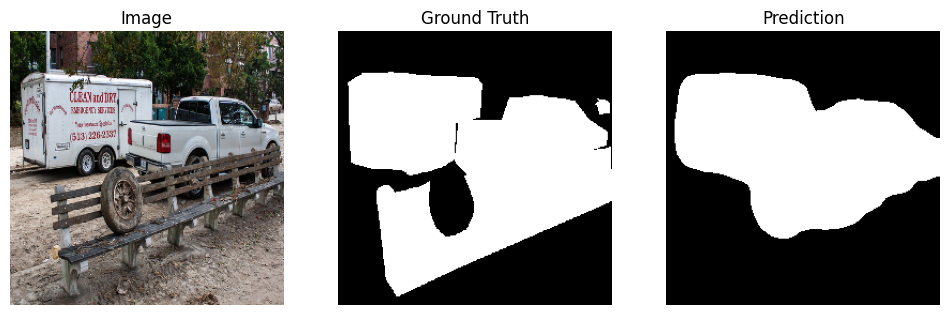

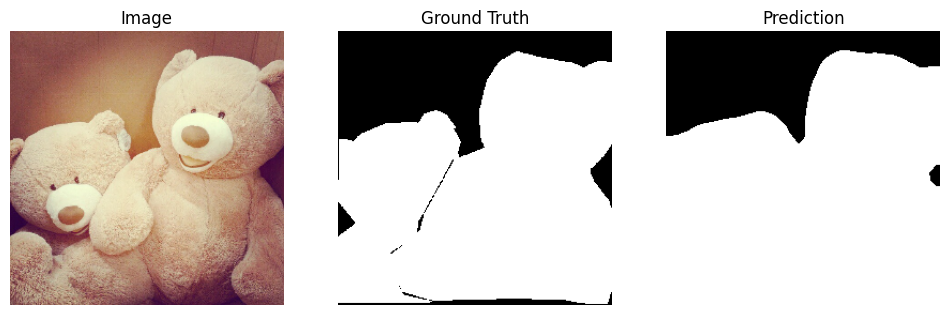

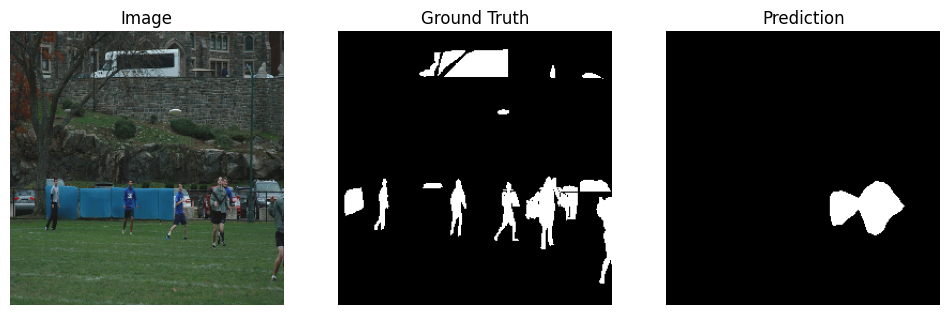

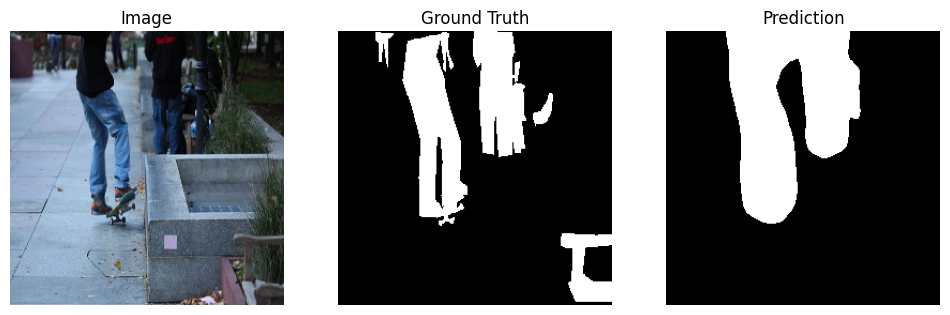

In [ ]:
# =========================================
# Week 4: Predictions and Fine-tuning
# Goal: Generate predictions on validation set, visualize, and improve model
# =========================================

# =========================
# Step 0: Imports
# =========================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import cv2
import numpy as np
import os
import random
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils
import albumentations as A

# =========================
# Step 1: Paths and COCO
# =========================
VAL_FOLDER = "/content/drive/MyDrive/VisionExtract/val2017"
ANNOT_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"
coco = COCO(ANNOT_FILE)

# =========================
# Step 2: Dataset
# =========================
IMG_HEIGHT, IMG_WIDTH = 256, 256

class SegmentationDataset(Dataset):
    def __init__(self, img_ids, img_folder, coco, augment=False):
        self.img_ids = img_ids
        self.img_folder = img_folder
        self.coco = coco
        self.augment = augment
        self.transform = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
        ], additional_targets={'mask':'mask'})

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_folder, img_info['file_name'])
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        for ann in anns:
            if 'segmentation' in ann:
                rle = mask_utils.frPyObjects(ann['segmentation'], img_info['height'], img_info['width'])
                decoded = mask_utils.decode(rle)
                if decoded.ndim == 3: decoded = np.sum(decoded, axis=2)
                mask += decoded
        mask = np.clip(mask, 0, 1)
        image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        if self.augment:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']
        image = np.transpose(image / 255.0, (2,0,1)).astype(np.float32)
        mask = np.expand_dims(mask.astype(np.float32), axis=0)
        return torch.tensor(image), torch.tensor(mask)

# =========================
# Step 3: Train/Validation Split (subset for speed)
# =========================
all_img_ids = coco.getImgIds()
random.shuffle(all_img_ids)
split = int(0.8 * len(all_img_ids))
train_ids, val_ids = all_img_ids[:split], all_img_ids[split:]

# Subset for fast testing
train_subset_ids = train_ids[:50]
val_subset_ids = val_ids[:20]

train_dataset = SegmentationDataset(train_subset_ids, VAL_FOLDER, coco, augment=True)
val_dataset = SegmentationDataset(val_subset_ids, VAL_FOLDER, coco, augment=False)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False)

# =========================
# Step 4: Model
# =========================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
weights = torchvision.models.segmentation.DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
model = torchvision.models.segmentation.deeplabv3_resnet50(weights=weights)
model.classifier[-1] = nn.Conv2d(256, 1, kernel_size=(1,1))  # binary output
model = model.to(device)

# =========================
# Step 5: Loss & Optimizer
# =========================
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# =========================
# Step 6: Training Loop
# =========================
num_epochs = 2
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * images.size(0)
    train_loss /= len(train_dataset)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)['out']
            loss = criterion(outputs, masks)
            val_loss += loss.item() * images.size(0)
    val_loss /= len(val_dataset)
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

# =========================
# Step 7: Visualize Predictions
# =========================
model.eval()
sample_val_ids = random.sample(val_subset_ids, 5)
with torch.no_grad():
    for img_id in sample_val_ids:
        idx = val_subset_ids.index(img_id)
        img_tensor, mask_tensor = val_dataset[idx]
        input_img = img_tensor.unsqueeze(0).to(device)
        pred = model(input_img)['out']
        pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()
        pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1)
        plt.imshow(np.transpose(img_tensor, (1,2,0)))
        plt.title("Image"); plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(mask_tensor.squeeze(), cmap='gray')
        plt.title("Ground Truth"); plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_mask_bin, cmap='gray')
        plt.title("Prediction"); plt.axis("off")
        plt.show()


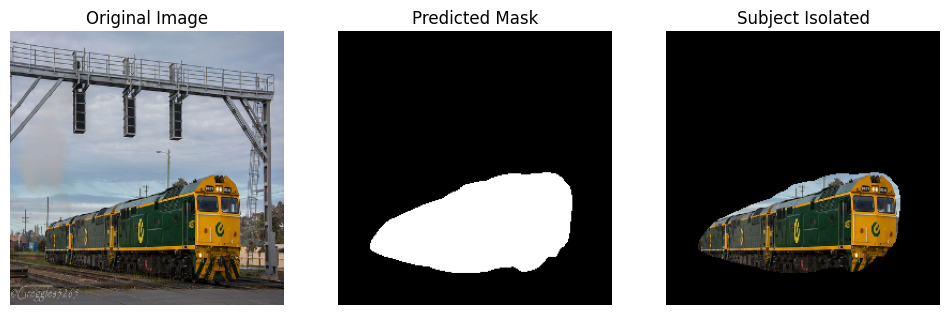

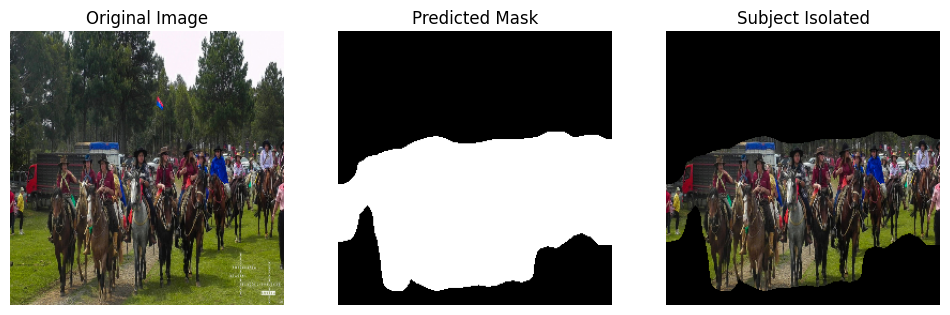

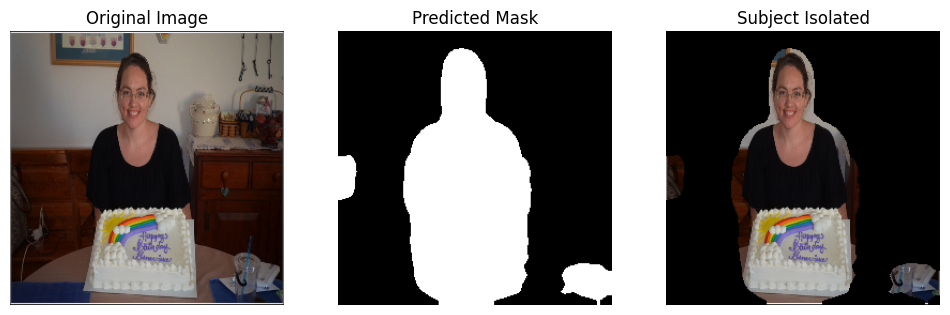

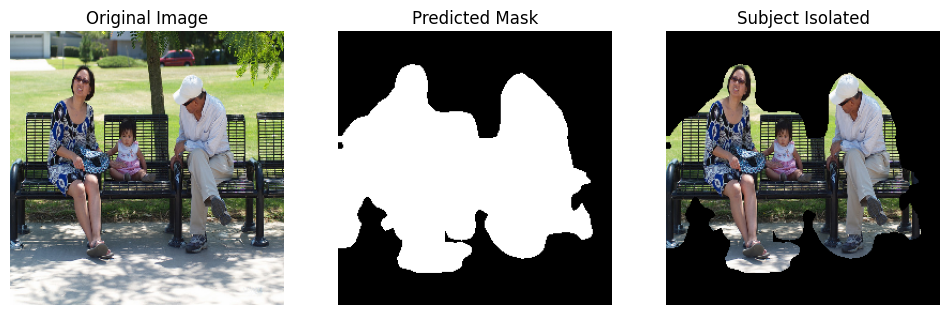

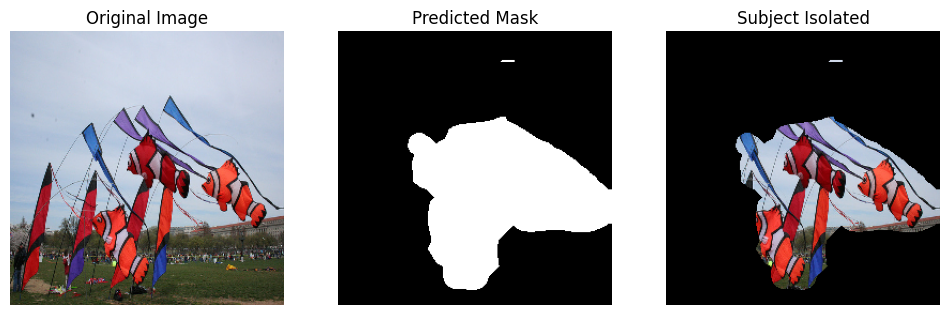

In [ ]:
# =========================
# Step 7: Visualize Predictions as Isolated Subject
# =========================
model.eval()
sample_val_ids = random.sample(val_subset_ids, 5)

with torch.no_grad():
    for img_id in sample_val_ids:
        idx = val_subset_ids.index(img_id)
        img_tensor, mask_tensor = val_dataset[idx]
        input_img = img_tensor.unsqueeze(0).to(device)
        pred = model(input_img)['out']
        pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()
        pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

        # Original image as numpy
        orig_img = np.transpose(img_tensor.cpu().numpy(), (1,2,0))
        orig_img = (orig_img * 255).astype(np.uint8)

        # Isolate subject by multiplying mask
        isolated_subject = orig_img * np.expand_dims(pred_mask_bin, axis=2)

        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1)
        plt.imshow(orig_img)
        plt.title("Original Image"); plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(pred_mask_bin, cmap='gray')
        plt.title("Predicted Mask"); plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(isolated_subject)
        plt.title("Subject Isolated"); plt.axis("off")
        plt.show()


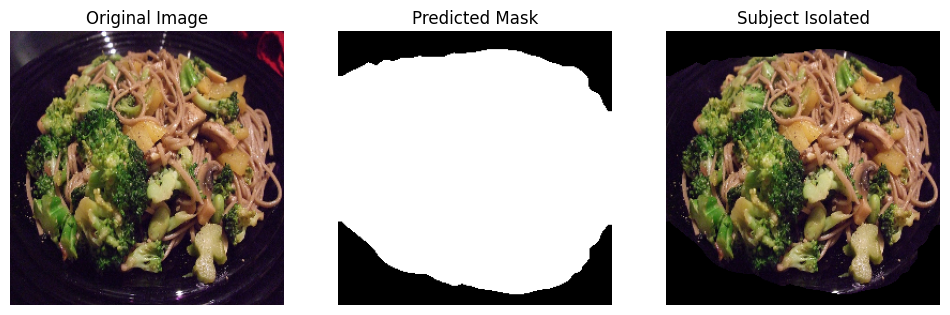

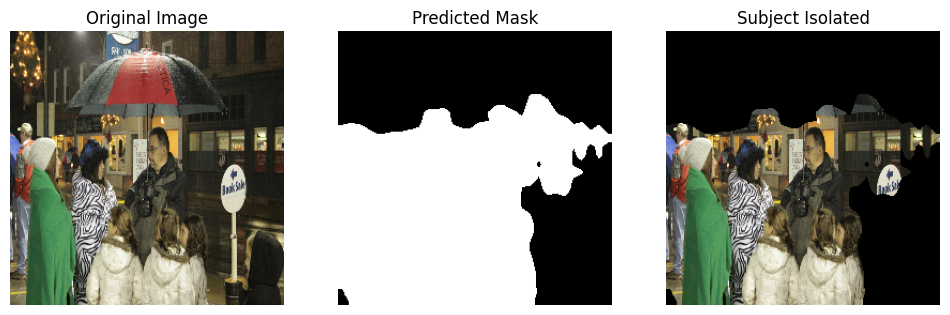

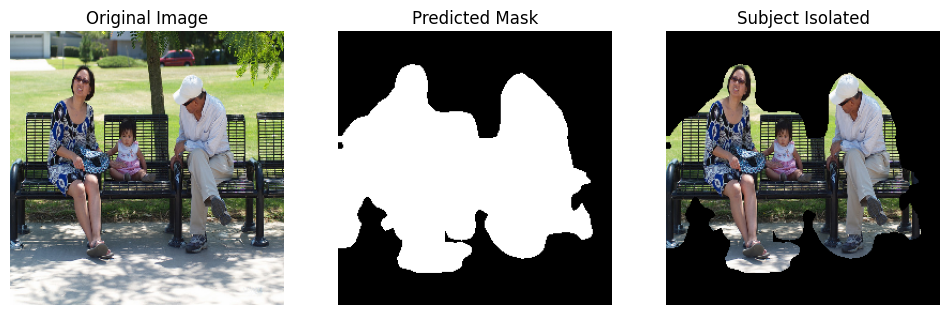

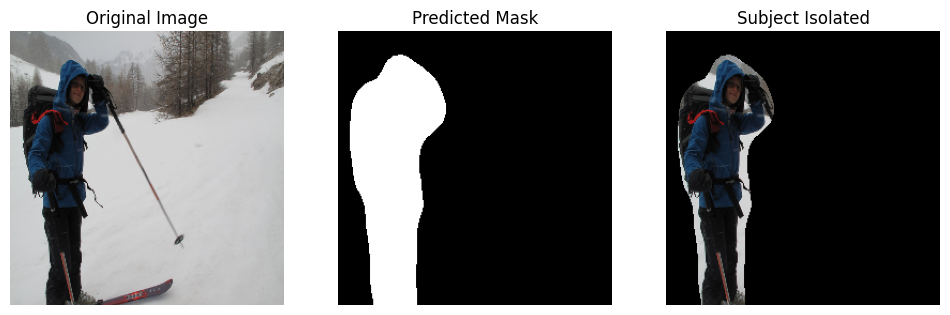

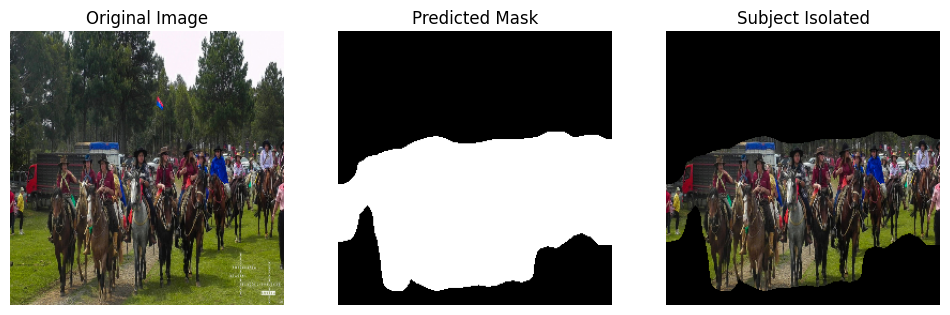

...

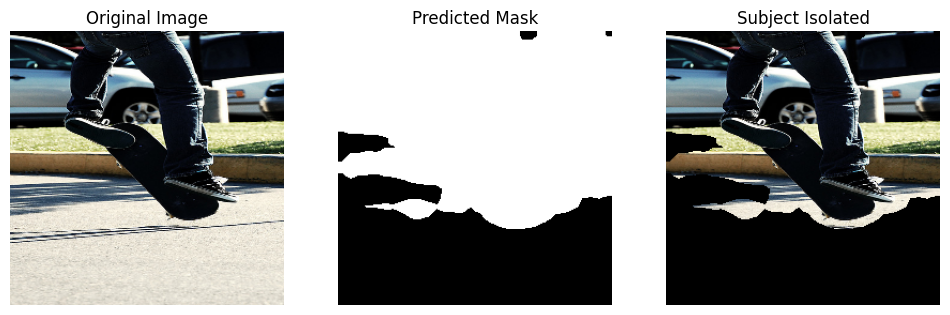

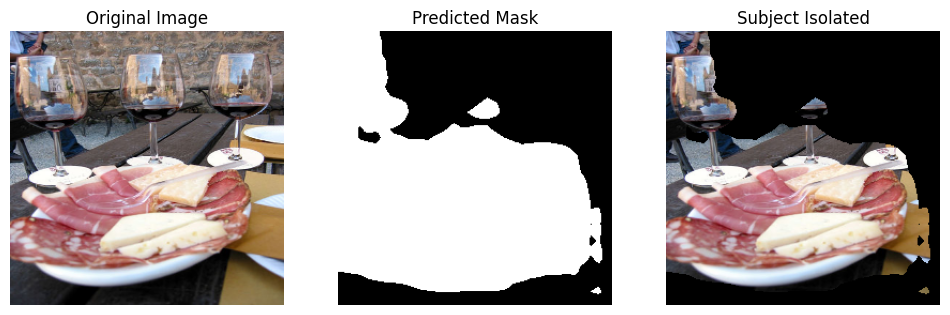

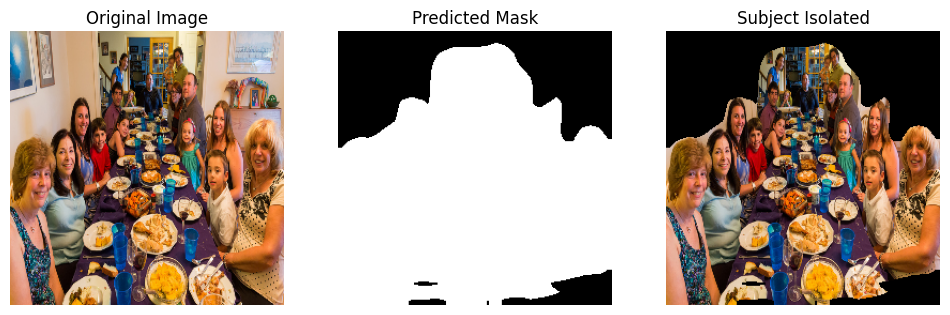

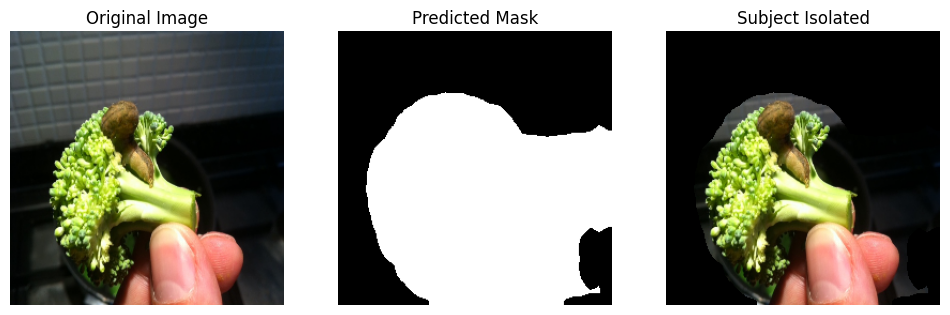

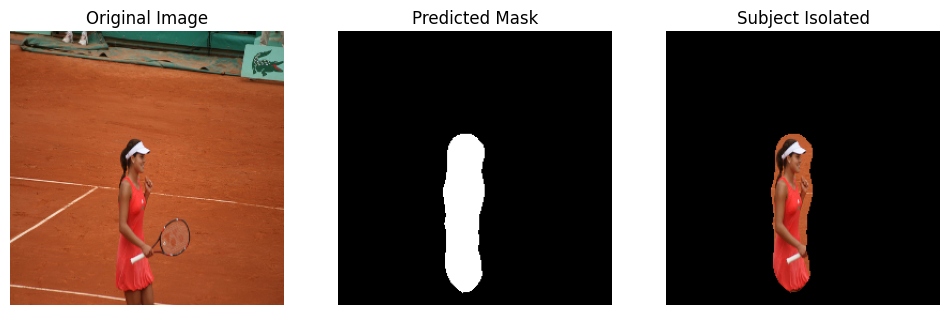

In [ ]:

model.eval()
sample_val_ids = random.sample(val_subset_ids, 15)

with torch.no_grad():
    for img_id in sample_val_ids:
        idx = val_subset_ids.index(img_id)
        img_tensor, mask_tensor = val_dataset[idx]
        input_img = img_tensor.unsqueeze(0).to(device)
        pred = model(input_img)['out']
        pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()
        pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)

        # Original image as numpy
        orig_img = np.transpose(img_tensor.cpu().numpy(), (1,2,0))
        orig_img = (orig_img * 255).astype(np.uint8)

        # Isolate subject by multiplying mask
        isolated_subject = orig_img * np.expand_dims(pred_mask_bin, axis=2)

        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1)
        plt.imshow(orig_img)
        plt.title("Original Image"); plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(pred_mask_bin, cmap='gray')
        plt.title("Predicted Mask"); plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(isolated_subject)
        plt.title("Subject Isolated"); plt.axis("off")
        plt.show()


In [ ]:
import torch
import numpy as np

def evaluate_segmentation(model, dataloader, device):
    """
    Evaluates segmentation model on validation set.

    Args:
        model : PyTorch segmentation model
        dataloader : DataLoader for validation set
        device : 'cuda' or 'cpu'

    Returns:
        pixel_accuracy : float
        mean_iou : float
        mean_dice : float
    """
    model.eval()
    all_pixel_acc = []
    all_ious = []
    all_dices = []

    with torch.no_grad():
        for imgs, masks in dataloader:
            imgs = imgs.to(device)  # [B, C, H, W]
            masks = masks.to(device)  # [B, H, W] or [B, 1, H, W]

            # Predict
            outputs = model(imgs)['out']  # for models like DeepLabV3
            preds = torch.sigmoid(outputs)  # convert logits to [0,1]
            preds = (preds > 0.5).float()  # binary mask

            if preds.shape != masks.shape:
                masks = masks.unsqueeze(1)  # ensure [B,1,H,W]

            # Flatten for metric calculation
            preds_flat = preds.view(-1)
            masks_flat = masks.view(-1)

            # Pixel Accuracy
            pixel_acc = (preds_flat == masks_flat).float().mean()
            all_pixel_acc.append(pixel_acc.item())

            # Intersection and Union for IoU
            intersection = (preds_flat * masks_flat).sum()
            union = ((preds_flat + masks_flat) > 0).float().sum()
            iou = (intersection / (union + 1e-7)).item()
            all_ious.append(iou)

            # Dice Coefficient
            dice = (2 * intersection) / (preds_flat.sum() + masks_flat.sum() + 1e-7)
            all_dices.append(dice.item())

    # Average over all batches
    pixel_accuracy = np.mean(all_pixel_acc)
    mean_iou = np.mean(all_ious)
    mean_dice = np.mean(all_dices)

    return pixel_accuracy, mean_iou, mean_dice


In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

pixel_acc, mean_iou, mean_dice = evaluate_segmentation(model, val_loader, device)

print(f"Pixel Accuracy: {pixel_acc:.4f}")
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Dice Coefficient: {mean_dice:.4f}")


Pixel Accuracy: 0.8412
Mean IoU: 0.6392
Dice Coefficient: 0.7750


loading annotations into memory...
Done (t=1.22s)
creating index...
index created!


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth


100%|██████████| 161M/161M [00:01<00:00, 128MB/s]


Epoch [1/15], Train Loss: 0.6407, Val Loss: 0.5648, Pixel Acc: 0.7224, Mean IoU: 0.4579, Dice: 0.5854
Epoch [2/15], Train Loss: 0.4868, Val Loss: 0.7288, Pixel Acc: 0.7127, Mean IoU: 0.4631, Dice: 0.5972
Epoch [3/15], Train Loss: 0.3970, Val Loss: 0.4316, Pixel Acc: 0.8407, Mean IoU: 0.5523, Dice: 0.6688
Epoch [4/15], Train Loss: 0.3765, Val Loss: 0.5578, Pixel Acc: 0.7966, Mean IoU: 0.5236, Dice: 0.6447
Epoch [5/15], Train Loss: 0.3438, Val Loss: 0.4705, Pixel Acc: 0.8089, Mean IoU: 0.5231, Dice: 0.6410
Epoch [6/15], Train Loss: 0.3395, Val Loss: 0.4750, Pixel Acc: 0.8226, Mean IoU: 0.5215, Dice: 0.6377
Epoch [7/15], Train Loss: 0.3078, Val Loss: 0.3874, Pixel Acc: 0.8286, Mean IoU: 0.5042, Dice: 0.6090
Epoch [8/15], Train Loss: 0.2751, Val Loss: 0.4077, Pixel Acc: 0.8115, Mean IoU: 0.5370, Dice: 0.6556
Epoch [9/15], Train Loss: 0.2895, Val Loss: 0.3810, Pixel Acc: 0.8271, Mean IoU: 0.4913, Dice: 0.5985
Epoch [10/15], Train Loss: 0.2732, Val Loss: 0.3733, Pixel Acc: 0.8345, Mean IoU: 

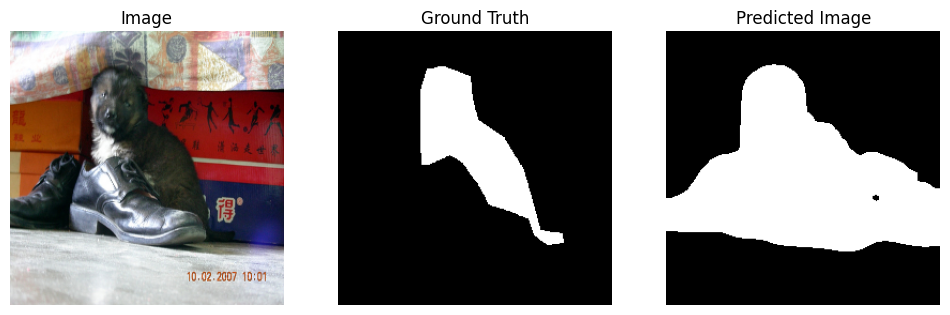

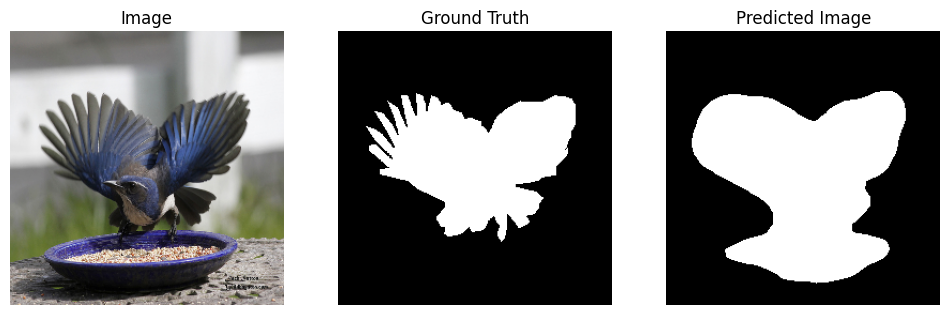

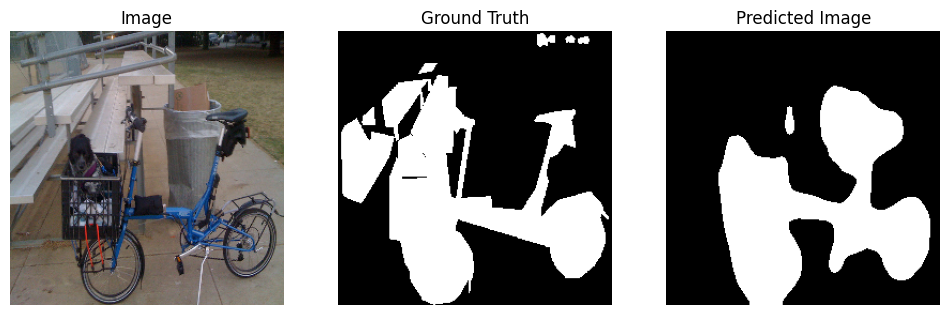

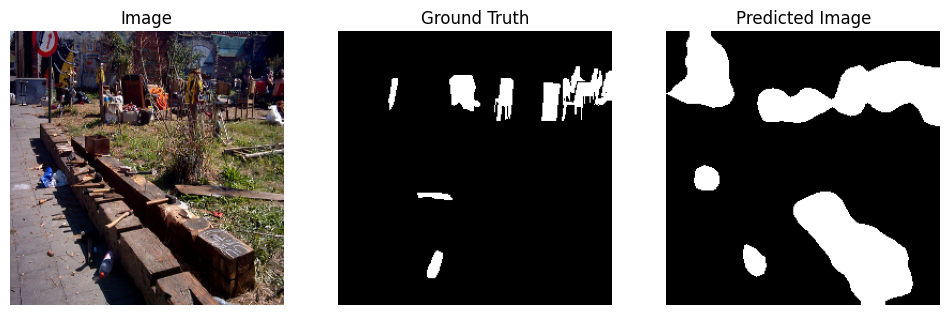

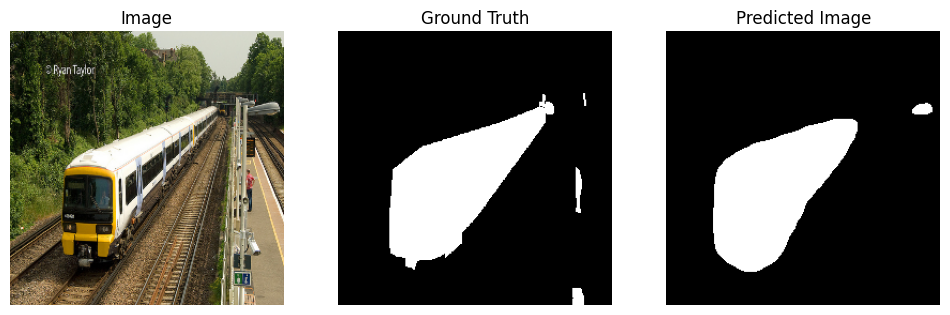

Model saved at: /content/drive/MyDrive/VisionExtract/deeplabv3_week4.pth


In [ ]:
# =========================================
# Week 4: Predictions and Fine-tuning
# Goal: Generate predictions on validation set, visualize, and improve model
# =========================================

# =========================
# Step 0: Imports
# =========================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import cv2
import numpy as np
import os
import random
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils
import albumentations as A

# =========================
# Step 1: Paths and COCO
# =========================
VAL_FOLDER = "/content/drive/MyDrive/VisionExtract/val2017"
ANNOT_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"
coco = COCO(ANNOT_FILE)

# =========================
# Step 2: Dataset
# =========================
IMG_HEIGHT, IMG_WIDTH = 256, 256

class SegmentationDataset(Dataset):
    def __init__(self, img_ids, img_folder, coco, augment=False):
        self.img_ids = img_ids
        self.img_folder = img_folder
        self.coco = coco
        self.augment = augment
        self.transform = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=30, p=0.5),
            A.RandomBrightnessContrast(p=0.5),
            A.HueSaturationValue(p=0.5),
        ], additional_targets={'mask':'mask'})

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_folder, img_info['file_name'])
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        for ann in anns:
            if 'segmentation' in ann:
                rle = mask_utils.frPyObjects(ann['segmentation'], img_info['height'], img_info['width'])
                decoded = mask_utils.decode(rle)
                if decoded.ndim == 3: decoded = np.sum(decoded, axis=2)
                mask += decoded
        mask = np.clip(mask, 0, 1)
        image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        if self.augment:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']
        image = np.transpose(image / 255.0, (2,0,1)).astype(np.float32)
        mask = np.expand_dims(mask.astype(np.float32), axis=0)
        return torch.tensor(image), torch.tensor(mask)

# =========================
# Step 3: Train/Validation Split (subset for speed)
# =========================
all_img_ids = coco.getImgIds()
random.shuffle(all_img_ids)
split = int(0.8 * len(all_img_ids))
train_ids, val_ids = all_img_ids[:split], all_img_ids[split:]

# Subset for fast testing
train_subset_ids = train_ids[:100]  # increased training images
val_subset_ids = val_ids[:40]       # increased validation images

train_dataset = SegmentationDataset(train_subset_ids, VAL_FOLDER, coco, augment=True)
val_dataset = SegmentationDataset(val_subset_ids, VAL_FOLDER, coco, augment=False)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

# =========================
# Step 4: Model
# =========================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
weights = torchvision.models.segmentation.DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
model = torchvision.models.segmentation.deeplabv3_resnet50(weights=weights)
model.classifier[-1] = nn.Conv2d(256, 1, kernel_size=(1,1))  # binary output
model = model.to(device)

# =========================
# Step 5: Loss & Optimizer
# =========================
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# =========================
# Step 6: Metrics Function
# =========================
def compute_metrics(y_true, y_pred):
    y_pred_bin = (y_pred > 0.5).astype(np.uint8)
    # Pixel Accuracy
    pixel_acc = np.sum(y_true == y_pred_bin) / (y_true.shape[0] * y_true.shape[1])
    # IoU
    intersection = np.logical_and(y_true, y_pred_bin).sum()
    union = np.logical_or(y_true, y_pred_bin).sum()
    iou = intersection / (union + 1e-7)
    # Dice
    dice = (2 * intersection) / (y_true.sum() + y_pred_bin.sum() + 1e-7)
    return pixel_acc, iou, dice

# =========================
# Step 7: Training Loop
# =========================
num_epochs = 15
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * images.size(0)
    train_loss /= len(train_dataset)

    # Validation
    model.eval()
    val_loss = 0.0
    all_pixel_acc, all_ious, all_dices = [], [], []
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)['out']
            loss = criterion(outputs, masks)
            val_loss += loss.item() * images.size(0)

            preds = torch.sigmoid(outputs).cpu().numpy()
            masks_np = masks.cpu().numpy()
            for i in range(preds.shape[0]):
                pixel_acc, iou, dice = compute_metrics(masks_np[i,0], preds[i,0])
                all_pixel_acc.append(pixel_acc)
                all_ious.append(iou)
                all_dices.append(dice)
    val_loss /= len(val_dataset)
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
          f"Pixel Acc: {np.mean(all_pixel_acc):.4f}, Mean IoU: {np.mean(all_ious):.4f}, Dice: {np.mean(all_dices):.4f}")

# =========================
# Step 8: Visualize Predictions
# =========================
model.eval()
sample_val_ids = random.sample(val_subset_ids, 5)
with torch.no_grad():
    for img_id in sample_val_ids:
        idx = val_subset_ids.index(img_id)
        img_tensor, mask_tensor = val_dataset[idx]
        input_img = img_tensor.unsqueeze(0).to(device)
        pred = model(input_img)['out']
        pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()
        # Post-processing to remove noise
        pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)
        pred_mask_bin = cv2.morphologyEx(pred_mask_bin, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))
        pred_mask_bin = cv2.morphologyEx(pred_mask_bin, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))

        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1)
        plt.imshow(np.transpose(img_tensor, (1,2,0)))
        plt.title("Image"); plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(mask_tensor.squeeze(), cmap='gray')
        plt.title("Ground Truth"); plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_mask_bin, cmap='gray')
        plt.title("Predicted Image"); plt.axis("off")
        plt.show()

# =========================
# Step 9: Save Model
# =========================
MODEL_PATH = "/content/drive/MyDrive/VisionExtract/deeplabv3_week4.pth"
torch.save(model.state_dict(), MODEL_PATH)
print(f"Model saved at: {MODEL_PATH}")


In [ ]:
import torch
import torchvision
import torch.nn as nn

# 1️⃣ Device setup: use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 2️⃣ Define the same model architecture as used in training
weights = torchvision.models.segmentation.DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
model = torchvision.models.segmentation.deeplabv3_resnet50(weights=weights)

# Modify classifier for binary output
model.classifier[-1] = nn.Conv2d(256, 1, kernel_size=(1,1))

# Move model to device
model = model.to(device)

# 3️⃣ Load the trained weights
MODEL_PATH = "/content/drive/MyDrive/VisionExtract/deeplabv3_week4.pth"
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))

# 4️⃣ Set model to evaluation mode
model.eval()

print("Week 4 model loaded successfully!")


Week 4 model loaded successfully!


In [ ]:
# Path to save
MODEL_PATH = "/content/drive/MyDrive/VisionExtract/deeplabv3_subject_model.pth"

# Save only the model weights (recommended)
torch.save(model.state_dict(), MODEL_PATH)
print("Model saved successfully!")


Model saved successfully!


**Load the model later**

In [ ]:
# Re-initialize the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
weights = torchvision.models.segmentation.DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
loaded_model = torchvision.models.segmentation.deeplabv3_resnet50(weights=weights)
loaded_model.classifier[-1] = nn.Conv2d(256, 1, kernel_size=(1,1))
loaded_model = loaded_model.to(device)

# Load the saved weights
loaded_model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
loaded_model.eval()
print("Model loaded successfully!")


Model loaded successfully!


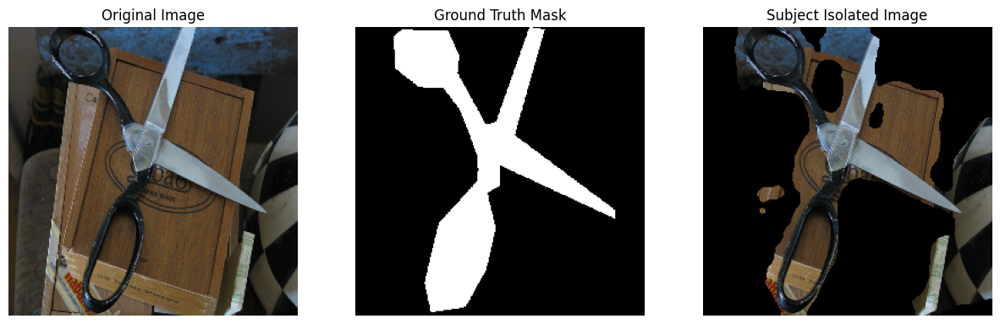

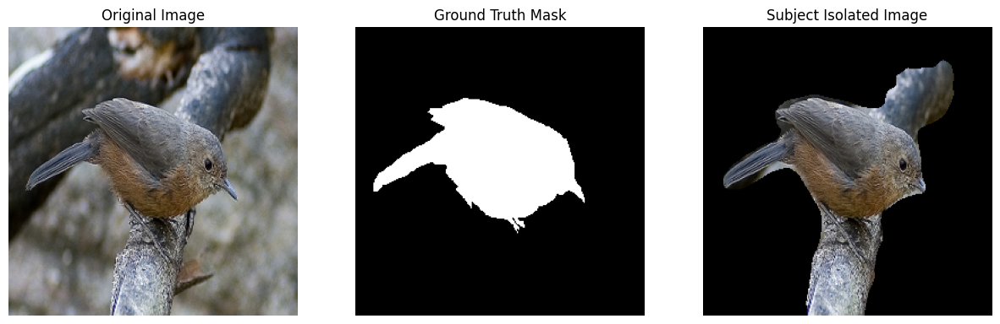

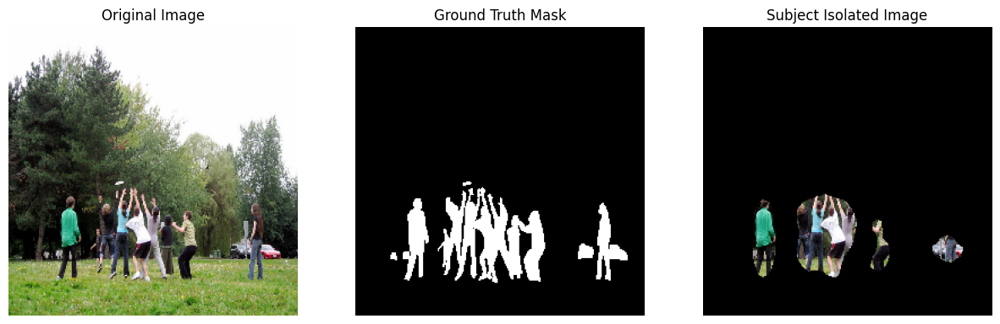

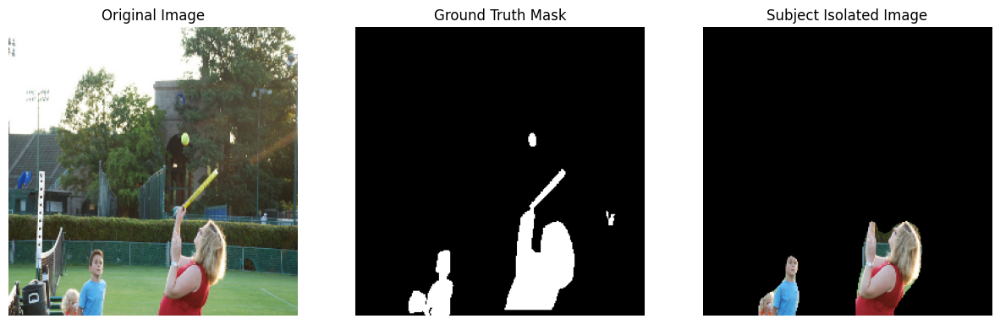

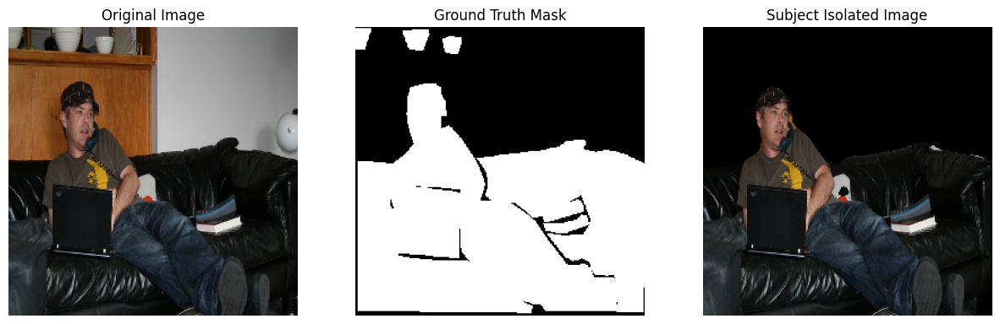

...

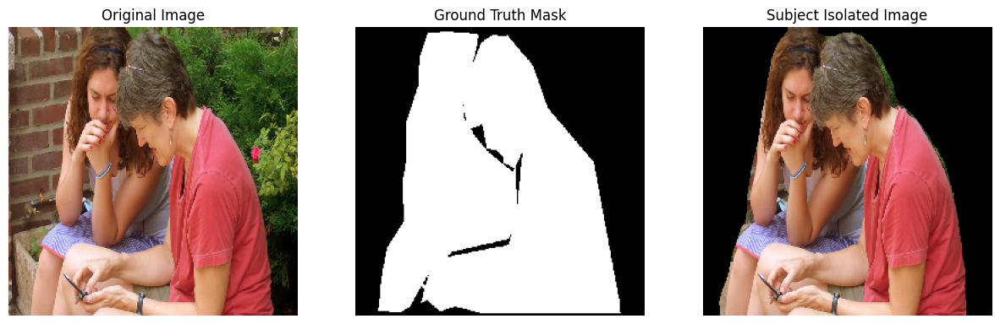

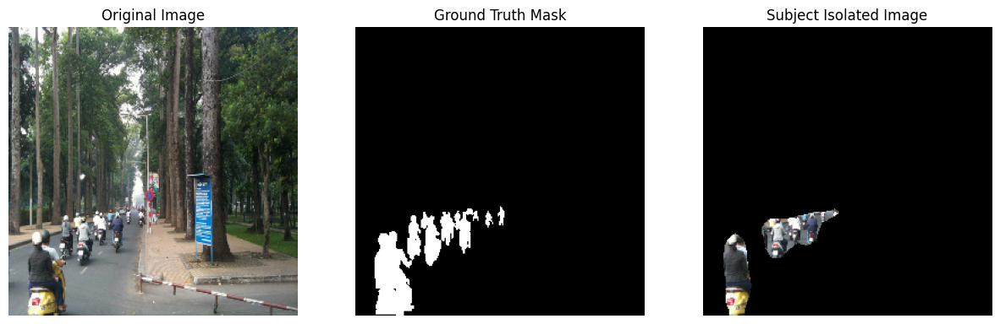

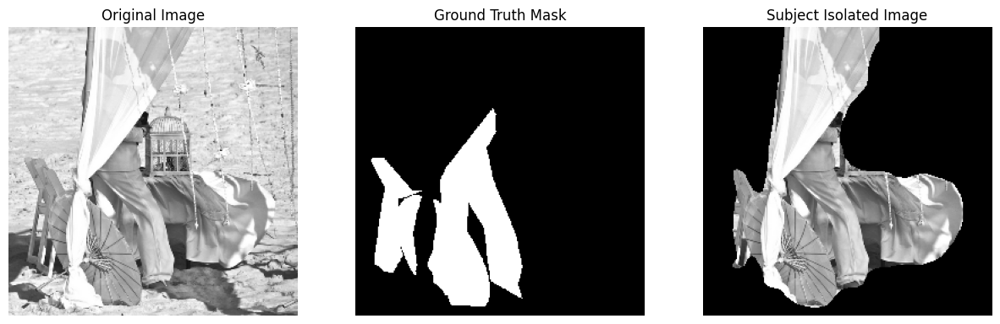

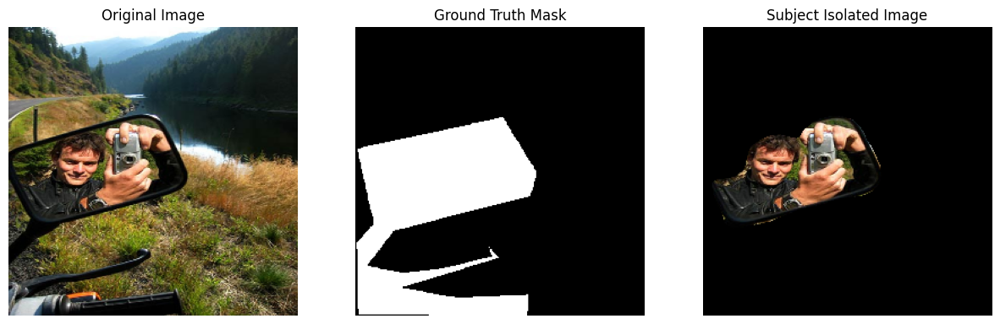

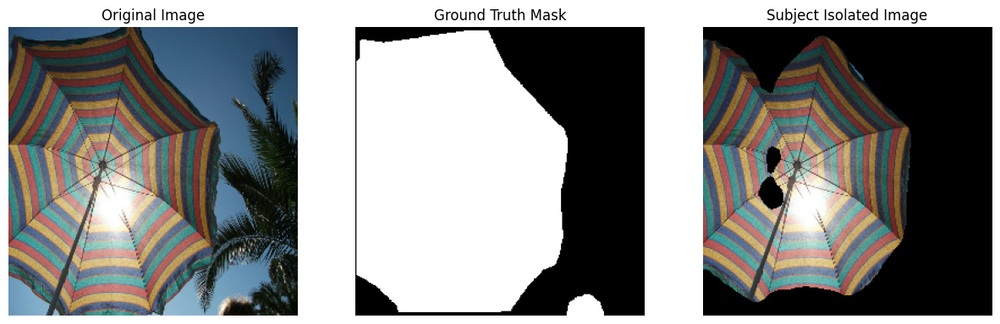

In [ ]:

# =========================
# Step 0: Imports
# =========================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import cv2
import numpy as np
import os
import random
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils
import albumentations as A

# =========================
# Step 1: Paths and COCO
# =========================
VAL_FOLDER = "/content/drive/MyDrive/VisionExtract/val2017"
ANNOT_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"
coco = COCO(ANNOT_FILE)

# =========================
# Step 2: Dataset
# =========================
IMG_HEIGHT, IMG_WIDTH = 256, 256

class SegmentationDataset(Dataset):
    def __init__(self, img_ids, img_folder, coco, augment=False):
        self.img_ids = img_ids
        self.img_folder = img_folder
        self.coco = coco
        self.augment = augment
        self.transform = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=30, p=0.5),
            A.RandomBrightnessContrast(p=0.5),
            A.HueSaturationValue(p=0.5),
        ], additional_targets={'mask':'mask'})

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        img_id = self.img_ids[idx]
        img_info = self.coco.loadImgs(img_id)[0]
        img_path = os.path.join(self.img_folder, img_info['file_name'])
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)
        for ann in anns:
            if 'segmentation' in ann:
                rle = mask_utils.frPyObjects(ann['segmentation'], img_info['height'], img_info['width'])
                decoded = mask_utils.decode(rle)
                if decoded.ndim == 3: decoded = np.sum(decoded, axis=2)
                mask += decoded
        mask = np.clip(mask, 0, 1)
        image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        if self.augment:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']
        image = np.transpose(image / 255.0, (2,0,1)).astype(np.float32)
        mask = np.expand_dims(mask.astype(np.float32), axis=0)
        return torch.tensor(image), torch.tensor(mask)

# =========================
# Step 3: Train/Validation Split (subset for speed)
# =========================
all_img_ids = coco.getImgIds()
random.shuffle(all_img_ids)
split = int(0.8 * len(all_img_ids))
train_ids, val_ids = all_img_ids[:split], all_img_ids[split:]

# Subset for fast testing
train_subset_ids = train_ids[:200]  # increased training images
val_subset_ids = val_ids[:80]       # increased validation images

train_dataset = SegmentationDataset(train_subset_ids, VAL_FOLDER, coco, augment=True)
val_dataset = SegmentationDataset(val_subset_ids, VAL_FOLDER, coco, augment=False)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)

# =========================
# Step 4: Model
# =========================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
weights = torchvision.models.segmentation.DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
model = torchvision.models.segmentation.deeplabv3_resnet50(weights=weights)
model.classifier[-1] = nn.Conv2d(256, 1, kernel_size=(1,1))  # binary output
model = model.to(device)

# =========================
# Step 5: Loss & Optimizer
# =========================
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# =========================
# Step 6: Metrics Function
# =========================
def compute_metrics(y_true, y_pred):
    y_pred_bin = (y_pred > 0.5).astype(np.uint8)
    # Pixel Accuracy
    pixel_acc = np.sum(y_true == y_pred_bin) / (y_true.shape[0] * y_true.shape[1])
    # IoU
    intersection = np.logical_and(y_true, y_pred_bin).sum()
    union = np.logical_or(y_true, y_pred_bin).sum()
    iou = intersection / (union + 1e-7)
    # Dice
    dice = (2 * intersection) / (y_true.sum() + y_pred_bin.sum() + 1e-7)
    return pixel_acc, iou, dice

# =========================
# Step 7: Training Loop
# =========================
num_epochs = 25
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * images.size(0)
    train_loss /= len(train_dataset)

    # Validation
    model.eval()
    val_loss = 0.0
    all_pixel_acc, all_ious, all_dices = [], [], []
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)['out']
            loss = criterion(outputs, masks)
            val_loss += loss.item() * images.size(0)

            preds = torch.sigmoid(outputs).cpu().numpy()
            masks_np = masks.cpu().numpy()
            for i in range(preds.shape[0]):
                pixel_acc, iou, dice = compute_metrics(masks_np[i,0], preds[i,0])
                all_pixel_acc.append(pixel_acc)
                all_ious.append(iou)
                all_dices.append(dice)
    val_loss /= len(val_dataset)
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
          f"Pixel Acc: {np.mean(all_pixel_acc):.4f}, Mean IoU: {np.mean(all_ious):.4f}, Dice: {np.mean(all_dices):.4f}")

# =========================
# Step 8: Visualize Predictions
# =========================
model.eval()
sample_val_ids = random.sample(val_subset_ids, 15)
with torch.no_grad():
    for img_id in sample_val_ids:
        idx = val_subset_ids.index(img_id)
        img_tensor, mask_tensor = val_dataset[idx]
        input_img = img_tensor.unsqueeze(0).to(device)
        pred = model(input_img)['out']
        pred_mask = torch.sigmoid(pred).cpu().squeeze().numpy()
        # Post-processing to remove noise
        pred_mask_bin = (pred_mask > 0.5).astype(np.uint8)
        pred_mask_bin = cv2.morphologyEx(pred_mask_bin, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))
        pred_mask_bin = cv2.morphologyEx(pred_mask_bin, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5)))

        plt.figure(figsize=(12,4))
        plt.subplot(1,3,1)
        plt.imshow(np.transpose(img_tensor, (1,2,0)))
        plt.title("Original Image"); plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(mask_tensor.squeeze(), cmap='gray')
        plt.title("Ground Truth Mask"); plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_mask_bin, cmap='gray')
        plt.title("Subject Isolated Image"); plt.axis("off")
        plt.show()

